# Projet 3 :

# Concevez une application au service de la santé publique

# Notebook de la partie exploration

# Salma CHAFAI

## A) Importation des bibliothèques essentiels 

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msn
import plotly.graph_objects as go
import plotly as plo
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode,iplot
from plotly.subplots import make_subplots

In [2]:
from sklearn import decomposition as dec
from sklearn import preprocessing as prep

## B) Le jeu de données 

In [3]:
data_food_net = pd.read_csv("C:/Users/salma/OneDrive/Bureau/Formation en alternance 2021_2023/Formation OpenClassRooms/Projets/Projet 3/Data/data_food_nett.csv", sep=',', header='infer', low_memory=False)
pd.set_option('display.max_columns', None)
data_food_net.head()

,code,product_name,categories,labels,nutriscore_grade,food_groups,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,nova_group
0,0000000000100,moutarde au moût de raisin,"Epicerie, Condiments, Sauces, Moutardes",Delois france,d,en:dressings-and-sauces,0.0,0.0,0.0,936.0,8.2,2.2,29.0,22.0,5.1,4.6,1.84,0.000000,4.0
1,000000002946,Pâte a tartiner,"Produits à tartiner, Petit-déjeuners, Produits...",en:palm-oil-free,b,en:sweets,1.0,0.0,0.0,21.0,39.6,5.8,42.8,12.8,8.7,0.2,0.08,18.168842,4.0
2,0000000274722,Blanquette de Volaille et son Riz,"Plats préparés, Produits à la viande, Plats pr...","Viande-francaise, Fabriqué en France",b,en:one-dish-meals,2.0,0.0,0.0,450.0,2.2,0.9,15.3,0.5,6.8,0.7,0.28,4.900000,4.0
3,0000000491228,Entremets Crème Brulée,"Produits laitiers, Desserts, Produits déshydra...",Point Vert,b,en:dairy-desserts,4.0,0.0,2.0,1952.4,15.3,11.2,75.5,69.8,6.8,0.5,0.20,0.000000,4.0
4,00000038,Pizza prosciutto,"Plats préparés, Pizzas tartes salées et quiche...","Nutriscore, Nutriscore A",c,en:pizza-pies-and-quiches,3.0,0.0,0.0,824.0,4.7,2.9,25.0,2.1,11.0,1.5,0.60,10.946474,4.0


In [4]:
#Data du jeu de données après la phase nettoyge
data_food_net.shape

(138206, 19)

<AxesSubplot:>

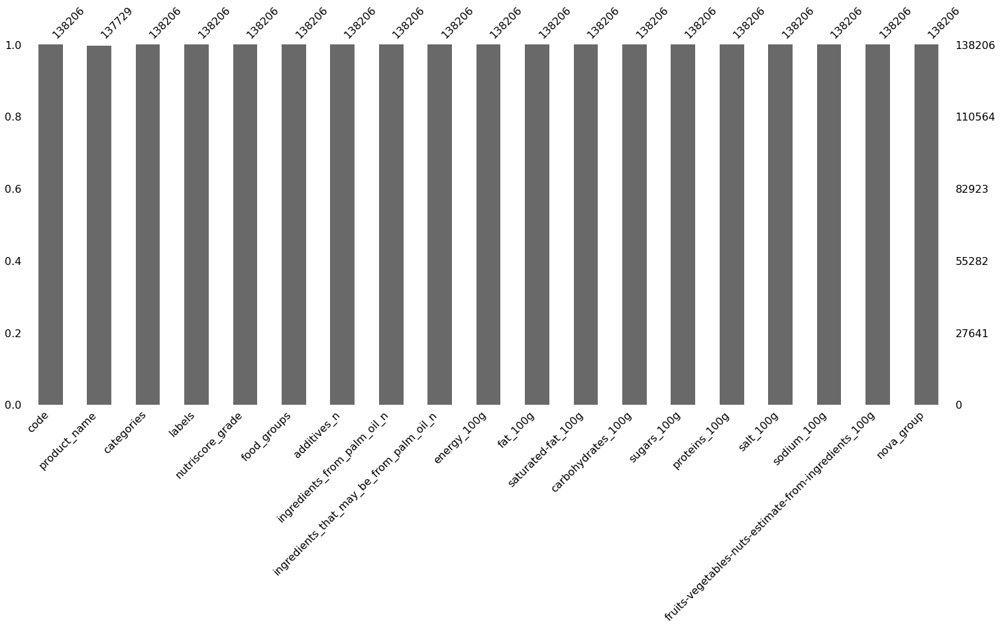

In [5]:
msn.bar(data_food_net)

## C) Exploration 

In [6]:
columns_cont = ['energy_100g','fat_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','proteins_100g','salt_100g',
           'sodium_100g','fruits-vegetables-nuts-estimate-from-ingredients_100g']

In [7]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
data_num = pd.DataFrame(data_food_net.select_dtypes(include=numerics))
l_col_num = data_num.columns.tolist()

### 1- Analyse univariée

In [8]:
data_food_net.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,nova_group
count,138206.000000,138206.000000,138206.000000,1.382060e+05,138206.000000,138206.000000,138206.000000,138206.000000,138206.000000,138206.000000,138206.000000,138206.000000,138206.000000
mean,1.435039,0.031511,0.096320,1.142680e+03,14.494091,5.653721,24.952744,11.794480,8.865041,0.948537,0.380555,12.963785,3.537010
std,2.076041,0.176917,0.367956,3.052838e+03,17.911700,8.735733,26.344187,17.602689,8.732526,2.267462,0.937683,25.557602,0.883464
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,4.650000e+02,1.500000,0.300000,2.300000,0.700000,2.100000,0.070000,0.028000,0.000000,3.000000
50%,1.000000,0.000000,0.000000,1.030000e+03,8.000000,2.100000,12.300000,3.120000,6.500000,0.510000,0.204000,0.000000,4.000000
75%,2.000000,0.000000,0.000000,1.657000e+03,22.300000,8.000000,49.000000,15.000000,13.000000,1.270000,0.508000,12.000000,4.000000
max,28.000000,2.000000,5.000000,1.094259e+06,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,56.000000,100.000000,4.000000


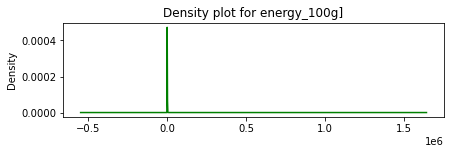

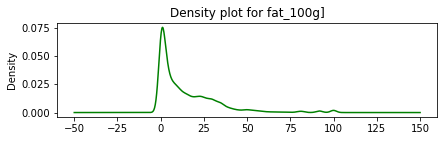

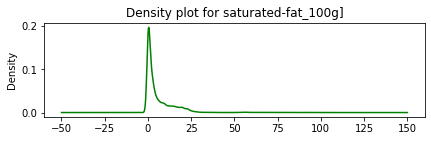

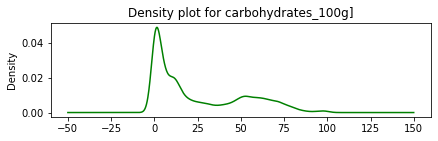

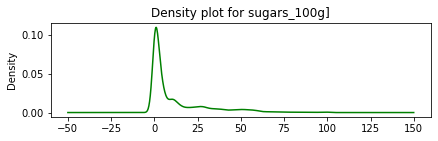

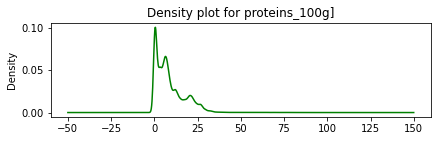

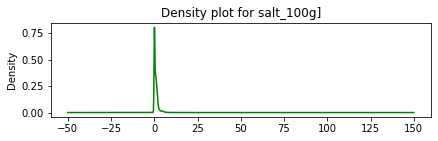

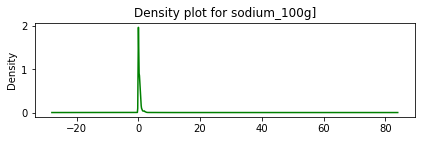

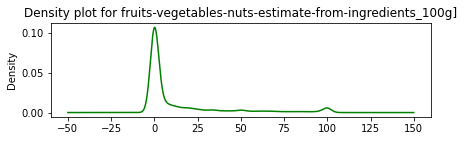

In [9]:
for i in range(len(columns_cont)) :
    plt.figure(figsize=(15,10))
    plt.subplot(5,2,i+1)
    data_food_net[columns_cont[i]].plot.density(color='green') 
    plt.title('Density plot for {}]'.format(columns_cont[i])) 
    plt.show()

**Interprétation**
- On remarque que la distribution des variables ne suivent pas une distribution normale

In [11]:
def boxplots(data, colonne) :
    plt.figure(figsize=(15,10))
    sns.set_theme(style="whitegrid")
    fig = px.box(data, x=colonne, width=600, height= 400)
    fig.show()

In [12]:
boxplots(data_num, 'proteins_100g')

<Figure size 1080x720 with 0 Axes>

In [13]:
fig = px.histogram(data_food_net, x = 'nutriscore_grade').update_xaxes(categoryorder = 'total descending')
fig

On remarque qu'on trouve plus de produits avec un nutriscore_grade = 'd' 

In [14]:
data_count = pd.DataFrame(data_food_net['categories'].value_counts(ascending = False))
data_count = data_count.reset_index()
data_count.columns = ['categories', 'occurences']
data_count.head(29)

,categories,occurences
0,"Viandes, Charcuteries, Jambons, Jambons blancs",1478
1,Boissons,1455
2,"Snacks, Snacks sucrés, Cacao et dérivés, Choco...",859
3,"Snacks, Snacks sucrés, Biscuits et gâteaux, Bi...",759
4,"Viandes, Volailles, Poulets, Filets de poulet",561
5,"Snacks, Snacks sucrés, Confiseries, Bonbons",508
6,"Aliments et boissons à base de végétaux, Alime...",507
7,"Produits à tartiner, Petit-déjeuners, Produits...",468
8,"Produits laitiers, Produits fermentés, Produit...",443
9,"Snacks, Snacks salés, Apéritif, Biscuits apéri...",442


In [15]:
list_cat = list(data_count['categories'].iloc[0:10])
list_cat

['Viandes, Charcuteries, Jambons, Jambons blancs',
 'Boissons',
 'Snacks, Snacks sucrés, Cacao et dérivés, Chocolats, Chocolats noirs',
 'Snacks, Snacks sucrés, Biscuits et gâteaux, Biscuits',
 'Viandes, Volailles, Poulets, Filets de poulet',
 'Snacks, Snacks sucrés, Confiseries, Bonbons',
 "Aliments et boissons à base de végétaux, Aliments d'origine végétale, Matières grasses, Matières grasses végétales, Produits de l'olivier, Huiles, Huiles d'olive, Huiles d'olive vierges, Huiles d'olive vierges extra",
 'Produits à tartiner, Petit-déjeuners, Produits à tartiner sucrés, Pâtes à tartiner, Pâtes à tartiner aux noisettes, Pâtes à tartiner au chocolat, Pâtes à tartiner aux noisettes et au cacao',
 'Produits laitiers, Produits fermentés, Produits laitiers fermentés, Fromages, Fromages à pâte pressée cuite, Fromages de France, Comté, en:aoc-cheeses, en:labeled-cheeses',
 'Snacks, Snacks salés, Apéritif, Biscuits apéritifs']

In [16]:
occ = list(data_count['occurences'].iloc[0:10])
occ

[1478, 1455, 859, 759, 561, 508, 507, 468, 443, 442]

In [19]:
# On représente les catégories de produits les plus fréquentes dans le jeu de données
fig = px.histogram(x = list_cat, y = occ, labels=dict(x="Les 10 catégrories les plus répétées", y="occurences"),
                  width=600, height=600)
fig.update_layout(bargap=0.2)
fig

- On remarque que qu'on a beaucoup de produits qui appartiennent à la catégorie "Viandes, Charcuteries"

### 2- Analyse bivariée

**Corrélation**

In [22]:
def cor(data) :
    mask_cor = np.triu(np.ones_like(data.corr())) 
    plt.figure(figsize=(10,7)) 
    sns.heatmap(data.corr(), mask=mask_cor)

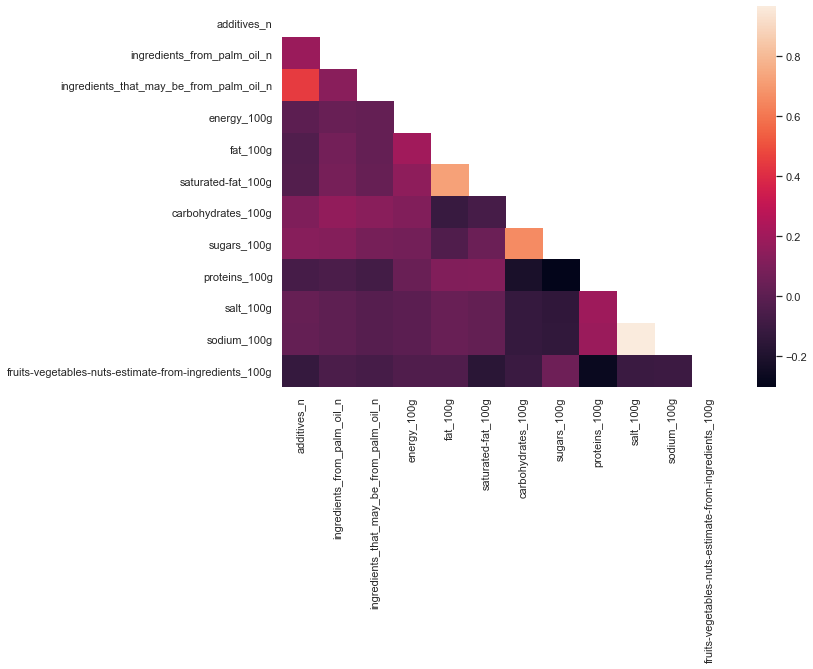

In [23]:
# On garde les variables numériques
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
l_col_num  = pd.DataFrame(data_food_net.select_dtypes(include=numerics)).columns.tolist()
l_col_num.remove('nova_group')
cor(data_food_net[l_col_num])

**Interprétation**

On remarque que :
- les deux variables "sodium_100g" et la variable "salt_100g" sont fortement corrélées;
- la variable "fat_100g" est corrélée avec la variable "energy_100g";
- la variable "carbohydrates_100g" est corrélée avec la variable "sugars_100g";

In [24]:
sns.set_theme(style="whitegrid")
fig = px.scatter(data_food_net, x='salt_100g', y='sodium_100g', width=600, height=400)
fig.show()

In [25]:
sns.set_theme(style="whitegrid")
fig = px.box(data_food_net, x='nutriscore_grade', y='sugars_100g', width=600, height=400)
fig.show()

On remarque que les boxplots qui ont la concentration la plus compacte correspondent aux nutriscore_grade = 'a' et 'b' pour le cas du sucre.

## C) ANOVA 

In [26]:
data_f = data_food_net[['nutriscore_grade', 'food_groups','categories','labels','proteins_100g', 'nova_group']]
data_f.head()

,nutriscore_grade,food_groups,categories,labels,proteins_100g,nova_group
0,d,en:dressings-and-sauces,"Epicerie, Condiments, Sauces, Moutardes",Delois france,5.1,4.0
1,b,en:sweets,"Produits à tartiner, Petit-déjeuners, Produits...",en:palm-oil-free,8.7,4.0
2,b,en:one-dish-meals,"Plats préparés, Produits à la viande, Plats pr...","Viande-francaise, Fabriqué en France",6.8,4.0
3,b,en:dairy-desserts,"Produits laitiers, Desserts, Produits déshydra...",Point Vert,6.8,4.0
4,c,en:pizza-pies-and-quiches,"Plats préparés, Pizzas tartes salées et quiche...","Nutriscore, Nutriscore A",11.0,4.0


On a vu auparavant que que les variables ne suivent pas la loi normale, donc l'anova n'est pas applicable ici

In [27]:
import scipy.stats as stats

In [28]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('proteins_100g ~ C(nutriscore_grade) + C(nova_group)',data_food_net).fit()
model.summary()
res = sm.stats.anova_lm(model, typ= 1) 
print(res)
print(res.sum_sq[-1])

                           df        sum_sq       mean_sq           F  PR(>F)
C(nutriscore_grade)       4.0  2.883244e+05  72081.089347  992.113826     0.0
C(nova_group)             3.0  2.101301e+05  70043.351966  964.066699     0.0
Residual             138198.0  1.004064e+07     72.654052         NaN     NaN
10040644.660704803


In [29]:
objects = (data_f.columns[0], data_f.columns[5])
# These are the column labels (factors)
print(objects)

('nutriscore_grade', 'nova_group')


## D) ACP

- L'ACP (Analyse en Composantes Principales) est l'une des méthodes d'analyse de données multivariées les plus utilisées. Elle nous permet d'étudier:
  - la variabilité des individus, i.e de trouver les différences et les ressemblances entre les individus ;
  - les liaisons entre les variables, i.e pouvoir regrouper des variables ensembles qui sont corrélées entre elle et les regrouper après en des nouvelles variables synthétiques
  

- **Le principe de l'ACP :**

L'ACP est considérée comme une méthode de projection qui permet de projeter les observations depuis l'espace à p dimensions des p variables vers un espace à k dimensions (avec k < p) tel qu'un maximum d'information soit conservée (l'information est ici mesurée au travers de la variance totale du nuage de points) sur les premières dimensions. Si l'information associée aux 2 ou 3 premiers axes représente un pourcentage suffisant de la variabilité totale du nuage de points, on pourra représenter les observations sur un graphique à 2 ou 3 dimensions, facilitant ainsi grandement l'interprétation.
Les axes principaux d'inertie sont des combinaisons linéaires des variables initiales.

### 1) Calcul des composantes principales

In [30]:
#rajouter les colonnes 
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
col_num = data_food_net.select_dtypes(include=numerics).columns.tolist()
col_num.remove('nova_group')

In [31]:
data_num = data_food_net[columns_cont]
data_num.head()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
0,936.0,8.2,2.2,29.0,22.0,5.1,4.6,1.84,0.000000
1,21.0,39.6,5.8,42.8,12.8,8.7,0.2,0.08,18.168842
2,450.0,2.2,0.9,15.3,0.5,6.8,0.7,0.28,4.900000
3,1952.4,15.3,11.2,75.5,69.8,6.8,0.5,0.20,0.000000
4,824.0,4.7,2.9,25.0,2.1,11.0,1.5,0.60,10.946474


In [32]:
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np
import pandas as pd

def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(10,10))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(10,10))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

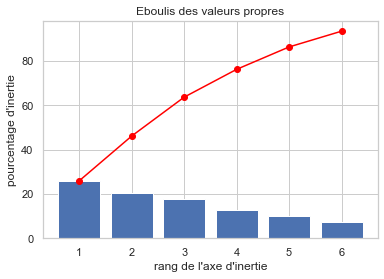

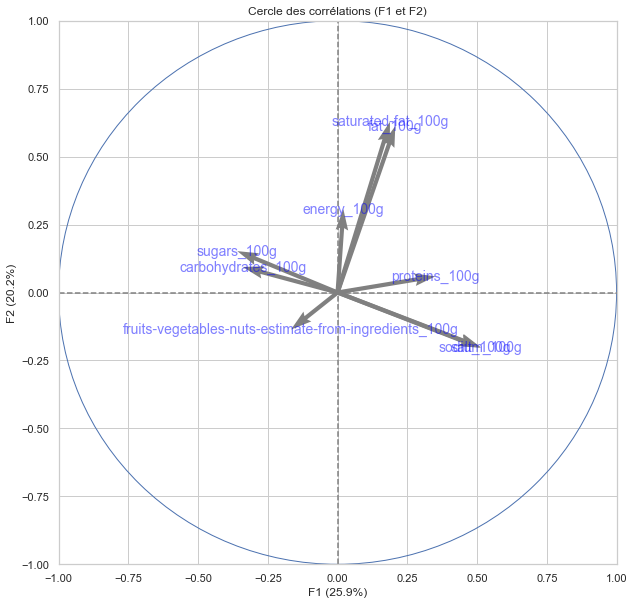

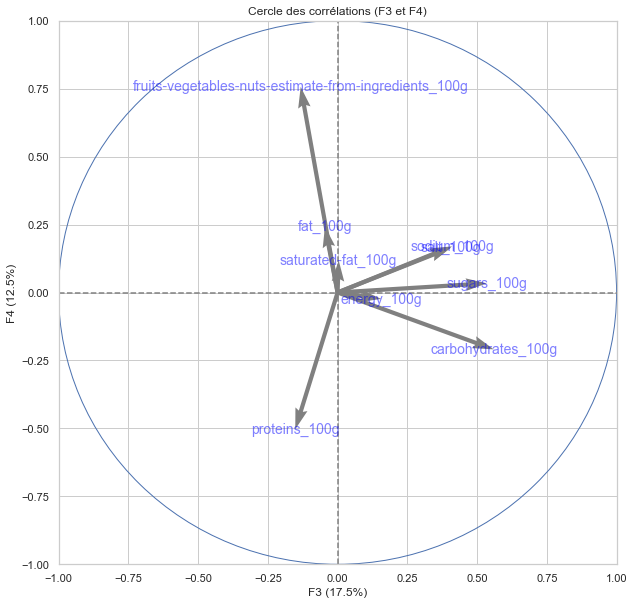

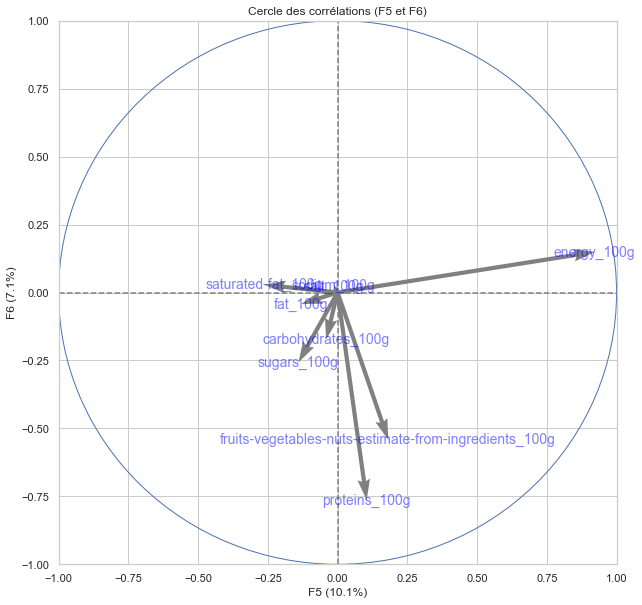

In [33]:
import pandas as pd
import numpy as np
from sklearn import decomposition
from sklearn import preprocessing
#from functions import *

# choix du nombre de composantes à calculer
n_comp = 6

# préparation des données pour l'ACP
X = data_num.values
names = data_food_net["product_name"] # ou data.index pour avoir les intitulés
features = data_num.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

# Eboulis des valeurs propres
display_scree_plot(pca)

# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))

# Projection des individus
#X_projected = pca.transform(X_scaled)
#display_factorial_planes(X_projected, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(names))

plt.show()

**Interprétation**
- On remarque que le premier plan factoriel représente que 46.6% de l'inertie totale

**Premier plan factoriel:**
- On remarque que : 
  - les variables "fat_100g", "saturated-fat_100g" sont les variables les plus corrélées (positivement) à l'axe F1, alors que les variables "salt_100g" et "sodium_100g" sont corrélées négativement à F1;
  - la variable "proteins_100g" est la variable la plus corrélée (positivement) à l'axe F2, alors que les variables "sugars_100g" sont corrélées négativement à F2;
  
**Deuxième plan factoriel:**
- On remarque que : 
  - la variables "fruits-vegetables-nuts-estimate-from-ingredients_100g" est la variable la plus corrélée (positivement) à l'axe F3, alors que la variable "proteins_100g" est la variable la plus corrélée négativement à F3;
  - les variables  "salt_100g", "sodium_100g", "carbohydrate_100g" et "sugars sont les variables les plus corrélées (positivement) à l'axe F4.